In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
files = os.listdir("C:\\Users\\Семья\\Documents\\bearing_samples\\")
tabs = []
names = []
for file in files:
    names.append(file)
    tabs.append(pd.read_csv("C:\\Users\\Семья\\Documents\\bearing_samples\\" + file))
tab = pd.concat(tabs, axis=1)

In [3]:
tab.columns = names

In [4]:
import sklearn.cluster as algos
from yellowbrick.cluster import KElbowVisualizer

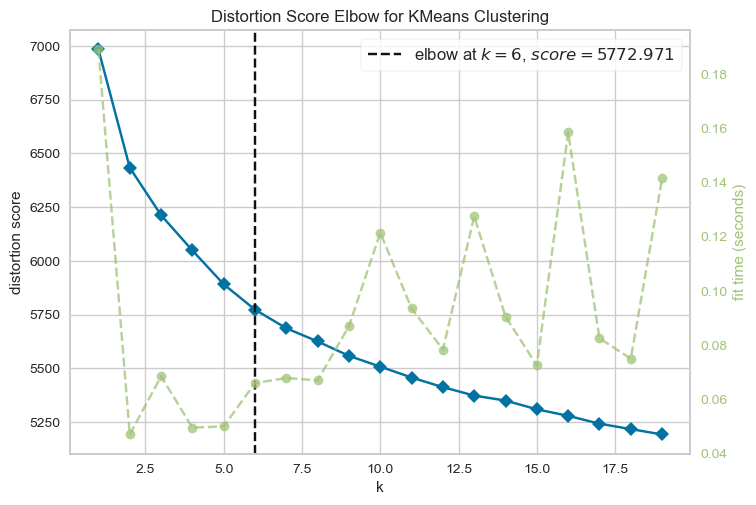

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [5]:
kmeans = algos.KMeans()
visualizer = KElbowVisualizer(kmeans, k=(1, 20)).fit(tab.sample(10000, random_state=239))
visualizer.show()

In [6]:
tabred = tab.sample(10000, random_state=239)
kmeans = algos.KMeans(n_clusters=6)
kmeans.fit(tabred)
tabred["cluster"] = kmeans.labels_ 

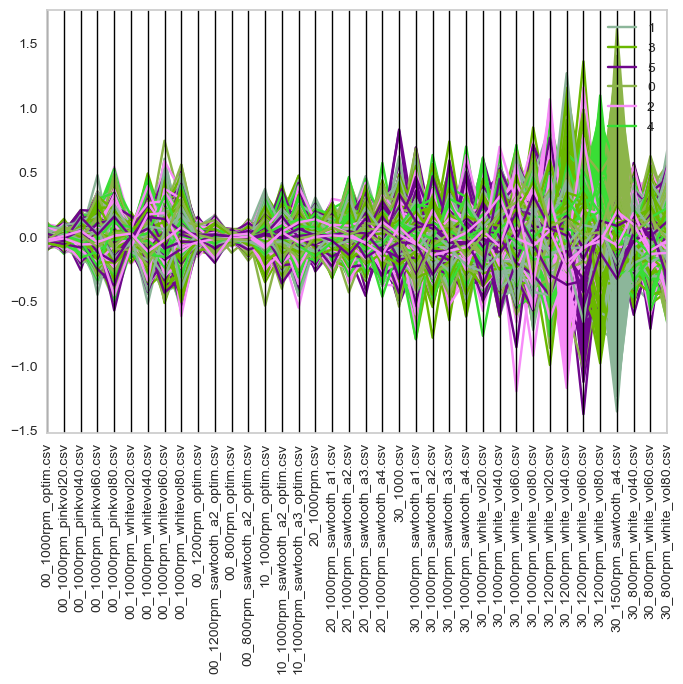

In [7]:
pd.plotting.parallel_coordinates(tabred, 'cluster')
a=plt.xticks(rotation=90)

In [8]:
affinity = algos.AffinityPropagation()

In [9]:
tabred2 = tab.sample(1000, random_state=239)
affinity.fit(tabred2)
tabred2["cluster"] = affinity.labels_

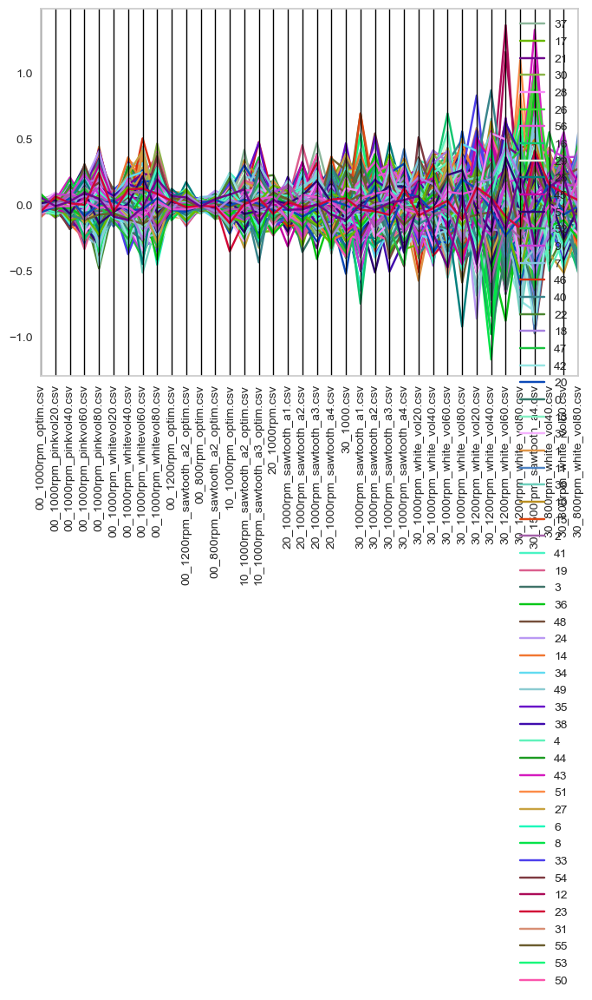

In [10]:
pd.plotting.parallel_coordinates(tabred2, 'cluster')
a=plt.xticks(rotation=90)

In [11]:
mean_shift = algos.MeanShift()

In [12]:
tabred3 = tab.sample(100, random_state=239)
mean_shift.fit(tabred3)
tabred3["cluster"] = mean_shift.labels_

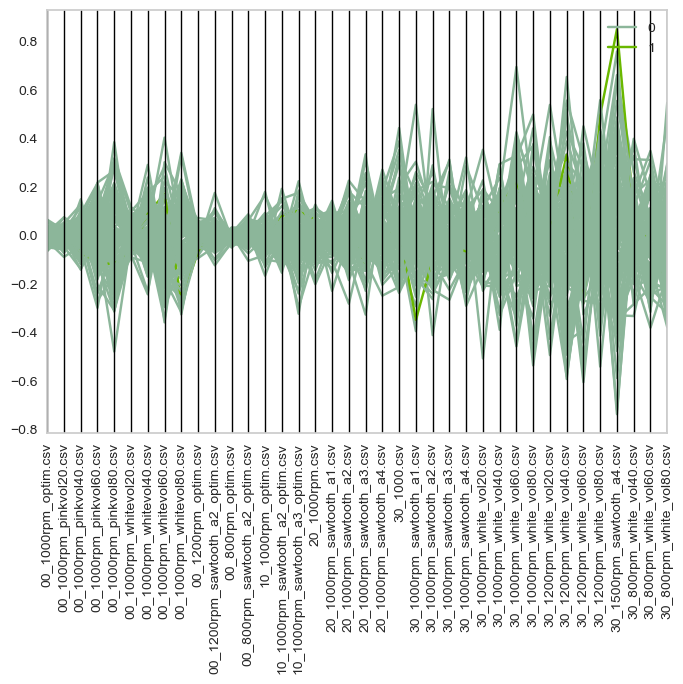

In [13]:
pd.plotting.parallel_coordinates(tabred3, 'cluster')
a=plt.xticks(rotation=90)

In [14]:
spectral = algos.SpectralClustering(n_clusters=6)

In [15]:
if "cluster" in tabred.columns:
    del tabred["cluster"]
spectral.fit(tabred)
tabred["cluster"] = spectral.labels_

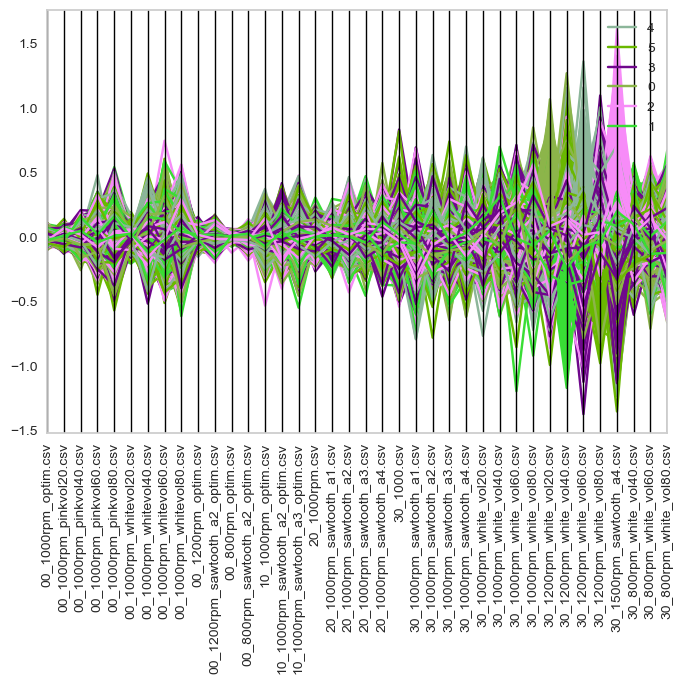

In [16]:
pd.plotting.parallel_coordinates(tabred, 'cluster')
a=plt.xticks(rotation=90)

In [17]:
agglomerative = algos.AgglomerativeClustering()

In [18]:
if "cluster" in tabred2.columns:
    del tabred2["cluster"]
agglomerative.fit(tabred2)
tabred2["cluster"] = agglomerative.labels_

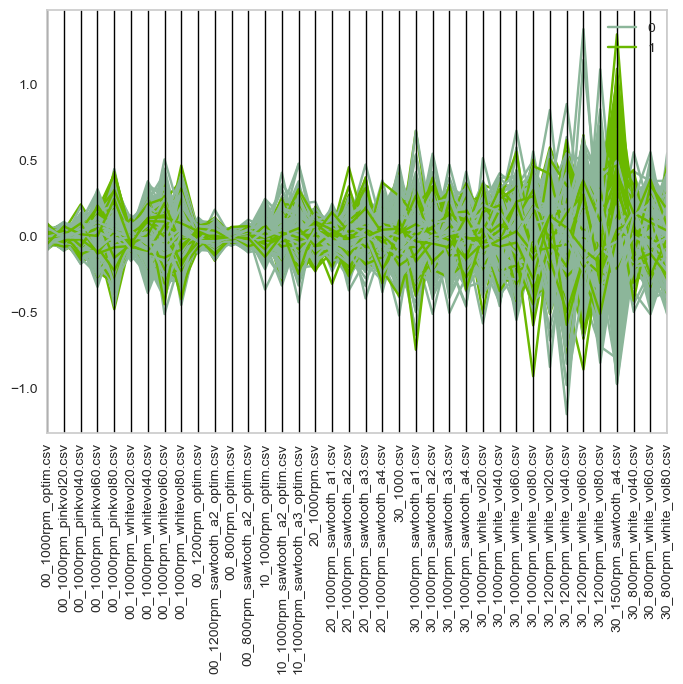

In [19]:
pd.plotting.parallel_coordinates(tabred2, 'cluster')
a=plt.xticks(rotation=90)

In [20]:
dbscan = algos.DBSCAN()

In [21]:
if "cluster" in tabred.columns:
    del tabred["cluster"]
dbscan.fit(tabred)
tabred["cluster"] = dbscan.labels_ 

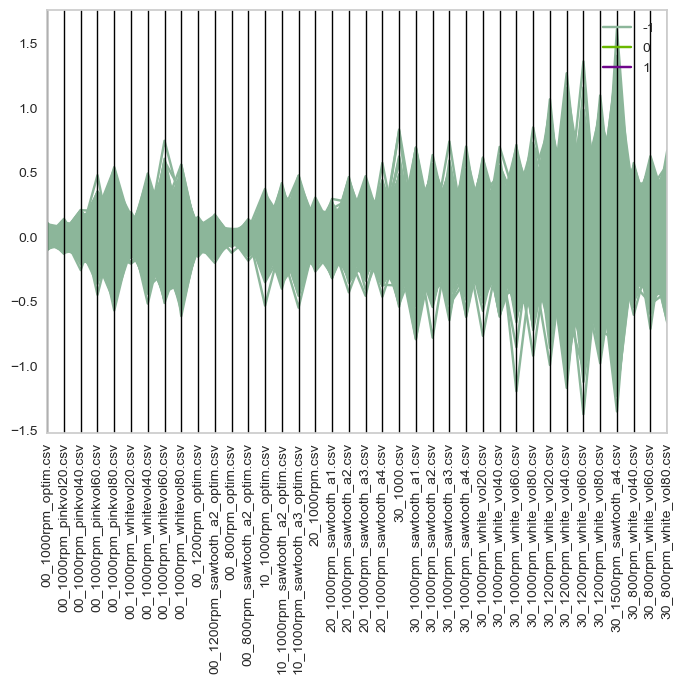

In [22]:
pd.plotting.parallel_coordinates(tabred, 'cluster')
a=plt.xticks(rotation=90)

In [23]:
hdbscan = algos.HDBSCAN(min_cluster_size=3)

In [24]:
if "cluster" in tabred.columns:
    del tabred["cluster"]
hdbscan.fit(tabred)
tabred["cluster"] = hdbscan.labels_

In [25]:
tabred["cluster"].describe()

count    10000.000000
mean        -0.205600
std          0.404901
min         -1.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: cluster, dtype: float64

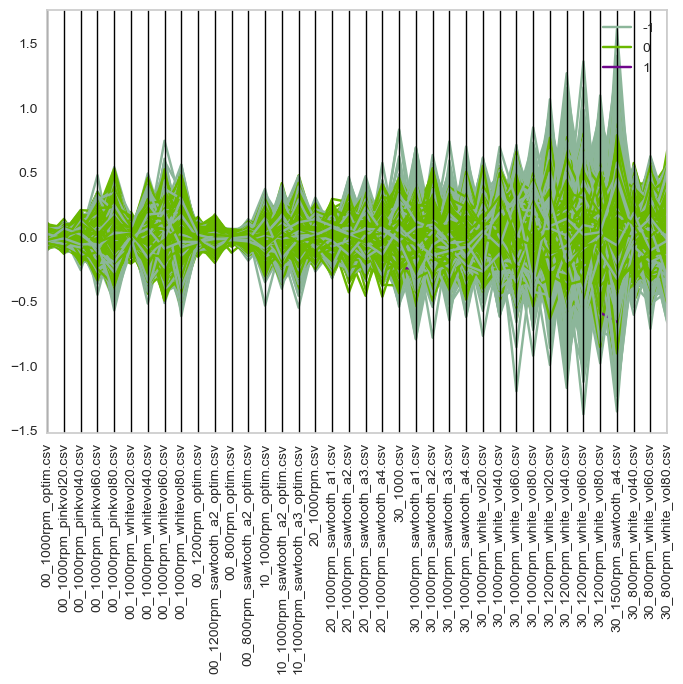

In [26]:
pd.plotting.parallel_coordinates(tabred, 'cluster')
a=plt.xticks(rotation=90)

In [27]:
import seaborn as sns

In [28]:
if "cluster" in tabred3.columns:
    del tabred3["cluster"]

In [29]:
sns.pairplot(tabred3, diag_kind='kde')